In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

n_sources = 2000

testObj = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),  #5000, 10), #
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2, zogyImageSpace=False)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.496768591977 0.496994002175
Variable source: 3 429.752272386 414.63348546 0 1753.62481734
Variable source: 6 46.6759323827 148.940680001 0 1753.62481734
Variable source: 9 102.283903909 414.390118979 0 1753.62481734
Variable source: 1 132.689760417 431.095513357 0 1753.62481734
Variable source: 0 184.110297424 55.0735139091 0 1753.62481734
Variable source: 8 54.4147787805 206.442625943 0 1753.62481734
Variable source: 2 217.649194012 64.6899364872 0 1753.62481734
Variable source: 7 69.9130201882 312.267119198 0 1753.62481734
Variable source: 4 294.005653691 77.2987945866 0 1753.62481734
Variable source: 5 227.793555583 199.293281357 0 1753.62481734
{'Zogy': {'FP': 75, 'FN': 4, 'TP': 6}, 'ALstack': {'FP': 4, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 53, 'FN': 2, 'TP': 8}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}


A&L(dec): stats(mean=0.18038183, stdev=25.737991, min=-181.79889, max=281.14066)
Zogy: stats(mean=-0.06205516288781146, stdev=26.579769465264075, min=-857.95860594333271, max=1507.6580817461556)
A&L(dec) - Zogy: stats(mean=0.08930073686106571, stdev=3.8183662916247556, min=-899.97873299084563, max=910.41220396579365)
A&L(dec) - A&L: stats(mean=-0.031465549, stdev=7.0801954, min=-52.534241, max=75.39505)
Scorr: stats(mean=3.6368727486333224e-06, stdev=0.00029877601028864998, min=-0.01740149284475441, max=0.021906848459295303)
Scorr_var: stats(mean=0.00025064755123993976, stdev=1.2117079926705461e-05, min=0.00023566618997089675, max=0.0014302665033399276)


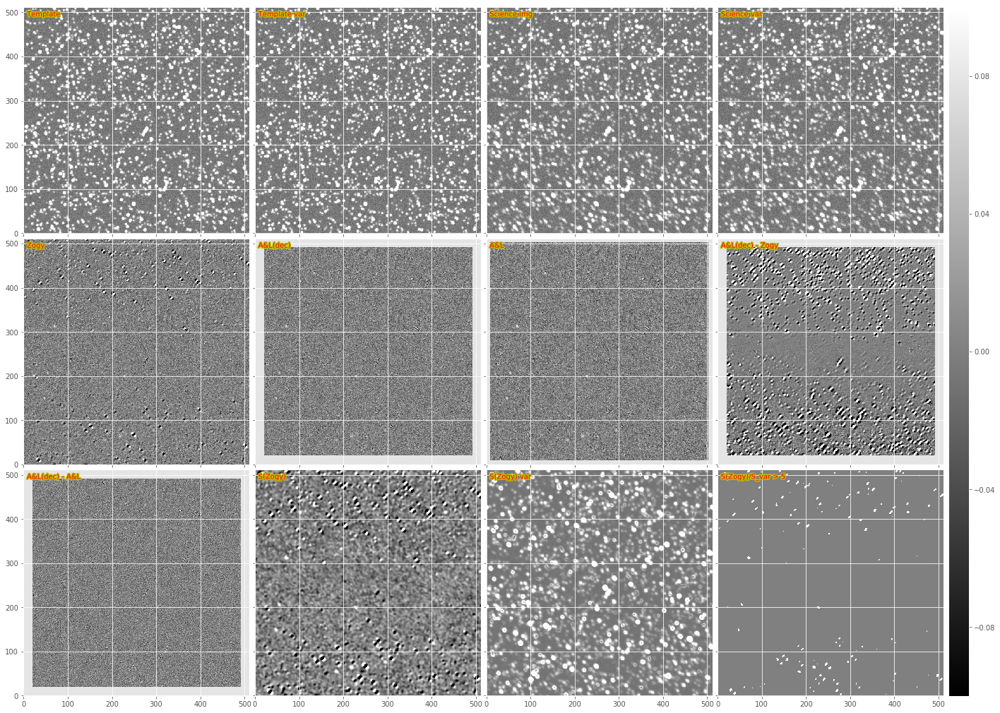

In [3]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

testObj.doPlot(imScale=6, include_Szogy=True);

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.496768591977 0.496994002175
Variable source: 3 429.752272386 414.63348546 0 1753.62481734
Variable source: 6 46.6759323827 148.940680001 0 1753.62481734
Variable source: 9 102.283903909 414.390118979 0 1753.62481734
Variable source: 1 132.689760417 431.095513357 0 1753.62481734
Variable source: 0 184.110297424 55.0735139091 0 1753.62481734
Variable source: 8 54.4147787805 206.442625943 0 1753.62481734
Variable source: 2 217.649194012 64.6899364872 0 1753.62481734
Variable source: 7 69.9130201882 312.267119198 0 1753.62481734
Variable source: 4 294.005653691 77.2987945866 0 1753.62481734
Variable source: 5 227.793555583 199.293281357 0 1753.62481734
{'Zogy': {'FP': 65, 'FN': 4, 'TP': 6}, 'ALstack': {'FP': 4, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 40, 'FN': 2, 'TP': 8}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}
A&L(dec): stats(mean=0.18038183, stdev=25.737991, min=-

diffimTests/diffimTests.py:106: RuntimeWarning: invalid value encountered in greater
  imagesToPlot.append((self.S_Zogy.im / self.S_Zogy.var > 5.) * 10.0)


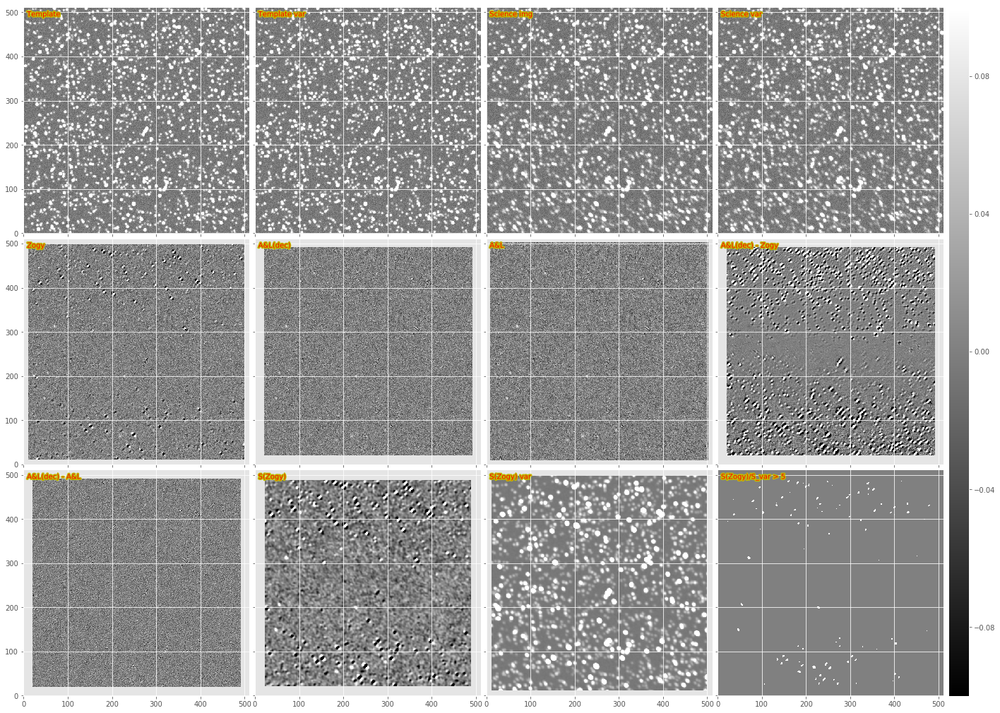

In [4]:
testObj2 = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res2 = testObj2.runTest(spatialKernelOrder=2, zogyImageSpace=True)
print res2
testObj2.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        imageSpace = kwargs.get('inImageSpace', False)
        doScorr = kwargs.get('Scorr', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
            #print 'HERE:', center.getX(), center.getY(), subExp.getPsf().computeShape(center).getDeterminantRadius()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if True and psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this *really* helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()

        if not doScorr:
            D_zogy, var_zogy = dit.zogy.computeZogy(subarr1, subarr2, subvar1, subvar2,
                              psf1b, psf2b, sig1=sig1, sig2=sig2, inImageSpace=imageSpace)

            tmpIM.getImage().getArray()[:, :] = D_zogy
            tmpIM.getVariance().getArray()[:, :] = var_zogy

        else:
            S, S_var, Pd, Fd = dit.zogy.computeZogyScorr(subarr1, subarr2, subvar1, subvar2, 
                              psf1b, psf2b, sig1=sig1, sig2=sig2, xVarAst=0., yVarAst=0., 
                              inImageSpace=imageSpace, padSize=7)

            tmpIM.getImage().getArray()[:, :] = S
            tmpIM.getVariance().getArray()[:, :] = S_var

        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


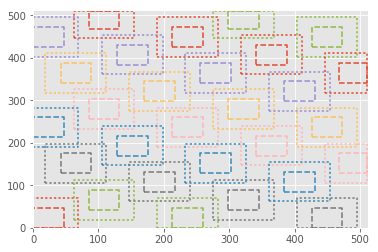

In [6]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
task._generateGrid(exposure, forceEvenSized=True)
task._plotBoxes(exposure.getBBox(), 5)

In [7]:
newExp = task.run(exposure, template=template, forceEvenSized=True).exposure #, variablePsf=testObj.variablePsf)

In [8]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, forceEvenSized=True, sigmas=[sig1, sig2]).exposure

17.5503 17.7639


In [9]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], forceEvenSized=True, inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


diffimTests/imageMapReduce.py:268: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:269: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [10]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def rb(array, width=5):  # remove border
    shape = array.shape
    return array[width:(shape[0]-width), width:(shape[1]-width)]

stats(mean=15.555352, stdev=29.498392, min=-82.0, max=5662.0)
stats(mean=-0.13291518, stdev=26.617611, min=-1600.7462, max=1512.6372)
stats(mean=-0.13384117, stdev=26.620497, min=-1605.2361, max=1507.6571)
stats(mean=-0.031231599, stdev=26.542404, min=-857.95898, max=998.10065)
stats(mean=9.0577793, stdev=16.223541, min=-35.734306, max=4985.9937)
stats(mean=-0.00010341966326011515, stdev=0.048236910158433767, min=-1595.3799485910786, max=374.65512537766364)
stats(mean=-6.4643804387094914e-08, stdev=4.6857362897520169e-05, min=-1599.8698167551411, max=374.39218592453864)
stats(mean=-1.6334772745093464e-06, stdev=0.0028793327891539489, min=-0.060115354704908697, max=0.058264140699510136)


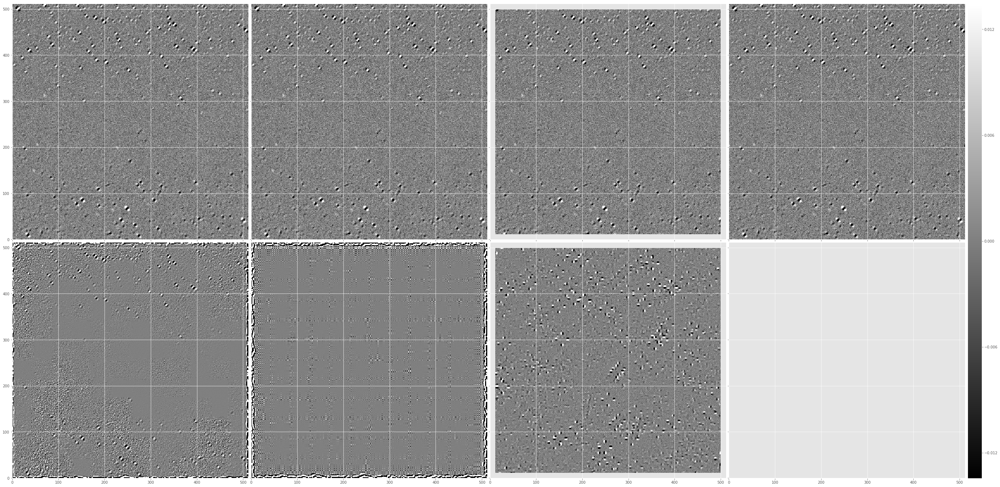

In [11]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im,
                  ga(newExpA)-testObj.D_Zogy.im, ga(newExpB)-testObj.D_Zogy.im), imScale=12)

try with *input* variable Psf

Now for S_corr

In [12]:
# Need even bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExp       = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=False, forceEvenSized=True).exposure
newExp_Scorr = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=True, forceEvenSized=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


stats(mean=6.0317716e-06, stdev=0.00025337152, min=-0.001589363, max=0.0029608407)
stats(mean=0.0002499242, stdev=1.9477697e-05, min=0.00021025156, max=0.0010285617)
stats(mean=3.6368727486333224e-06, stdev=0.00029877601028864998, min=-0.01740149284475441, max=0.021906848459295303)
stats(mean=0.00025064755123993976, stdev=1.2117079926705461e-05, min=0.00023566618997089675, max=0.0014302665033399276)
stats(mean=-1.949117680692563e-07, stdev=9.5779820500464384e-05, min=-0.021298818043689549, max=0.01701744623593944)


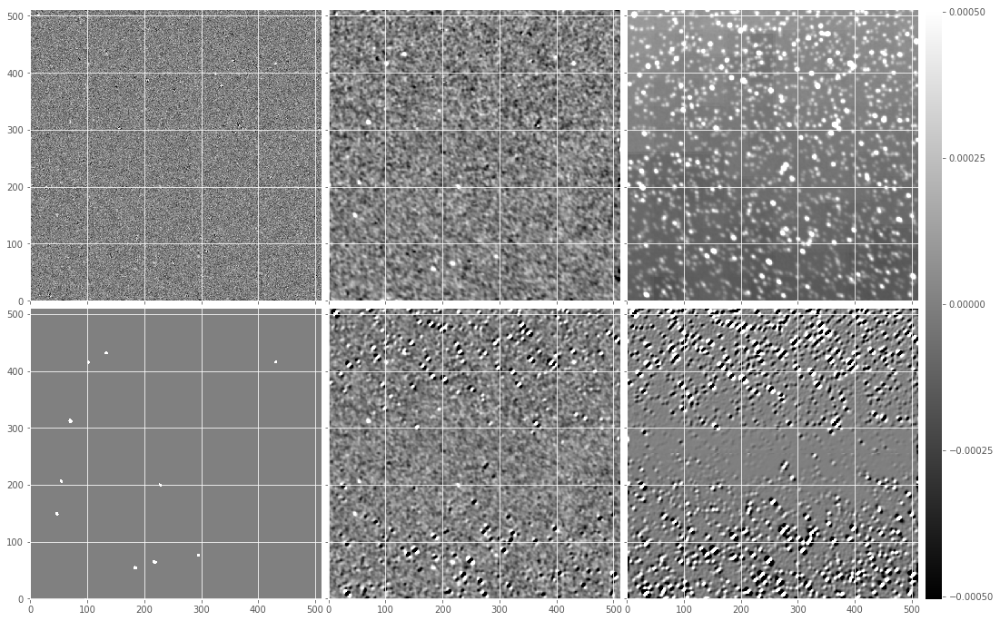

In [13]:
Sim = ga(newExp_Scorr)
Svar = gv(newExp_Scorr)
print dit.computeClippedImageStats(rb(Sim))
print dit.computeClippedImageStats(rb(Svar))
print dit.computeClippedImageStats(testObj.S_Zogy.im)
print dit.computeClippedImageStats(testObj.S_Zogy.var)
print dit.computeClippedImageStats(rb(Sim-testObj.S_Zogy.im))
dit.plotImageGrid((ga(newExp), Sim, Svar, (Sim/Svar > 5.0) * 1.0, testObj.S_Zogy.im, Sim-testObj.S_Zogy.im), imScale=6)

A&L(dec): stats(mean=0.18038183, stdev=25.737991, min=-181.79889, max=281.14066)
Zogy: stats(mean=-0.020286042, stdev=25.613817, min=-1083.0469, max=230.42825)
A&L(dec) - Zogy: stats(mean=0.065282397, stdev=2.5251741, min=-70.284409, max=119.7728)
A&L(dec) - A&L: stats(mean=-0.031465549, stdev=7.0801954, min=-52.534241, max=75.39505)
Scorr: stats(mean=4.894971e-06, stdev=0.00025460953, min=-0.0049105762, max=0.0029608407)
Scorr_var: stats(mean=0.00024989285, stdev=1.9670939e-05, min=0.00021025156, max=0.0010285617)


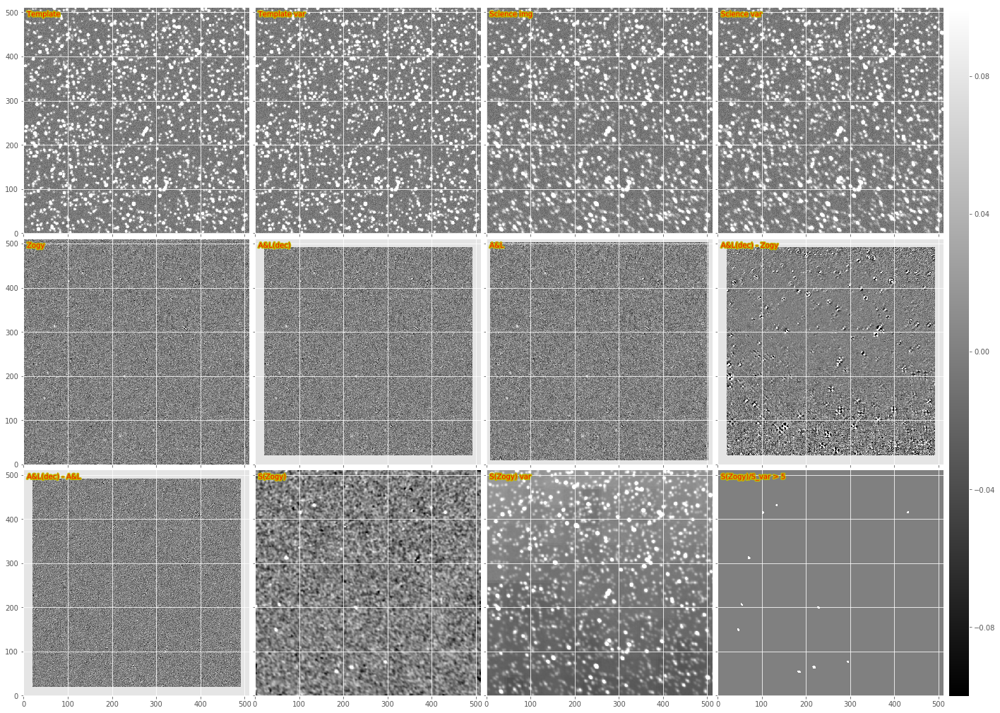

In [14]:
testObj2 = testObj.clone()
testObj2.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj2.D_Zogy = dit.Exposure(ga(newExp), dit.psf.afwPsfToArray(newExp.getPsf()), gv(newExp))
testObj2.doPlot(imScale=6, include_Szogy=True);

Time to try measured PSFs again...

In [15]:
import testPsfexPsfEDITED as tpp

exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(template2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

1248
1311


(41, 41)
(ixx=4.060151003, iyy=4.10754319355, ixy=-0.672448207535)


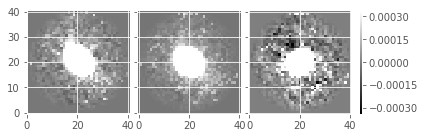

In [23]:
import lsst.afw.geom as afwGeom

# psf1 = psf.computeImage(afwGeom.Point2D(20., 20.)).getArray()
# psf1b = psf1.copy()
# psf1b[psf1b < 0] = 0
# print psf1b[0:10,:].mean(), psf1b[:,0:10].mean(), psf1b[31:41,:].mean(), psf1b[:,31:41].mean()
# psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
# psf1b /= psf1b.sum()

psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

(ixx=2.63940192605, iyy=2.66655419308, ixy=-0.00570840707481)


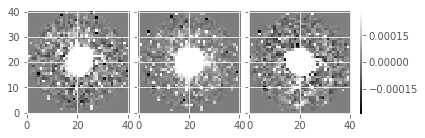

In [24]:
psf = template2.getPsf()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


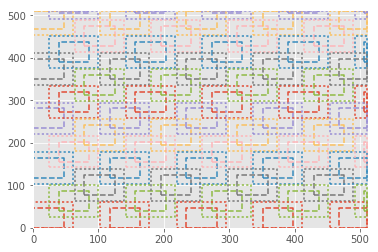

In [18]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExp2_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure
task._plotBoxes(exposure2.getBBox())

A&L(dec): stats(mean=0.18038183, stdev=25.737991, min=-181.79889, max=281.14066)
Zogy: stats(mean=-0.040158764, stdev=26.282396, min=-331.31625, max=1481.1382)
A&L(dec) - Zogy: stats(mean=0.35809442, stdev=29.048077, min=-400.5896, max=149.87601)
A&L(dec) - A&L: stats(mean=-0.031465549, stdev=7.0801954, min=-52.534241, max=75.39505)
Scorr: stats(mean=-1.128956e-05, stdev=0.00025990006, min=-33.000767, max=1428.0006)
Scorr_var: stats(mean=0.00023477347, stdev=1.9381157e-05, min=0.00019447618, max=1578.0004)


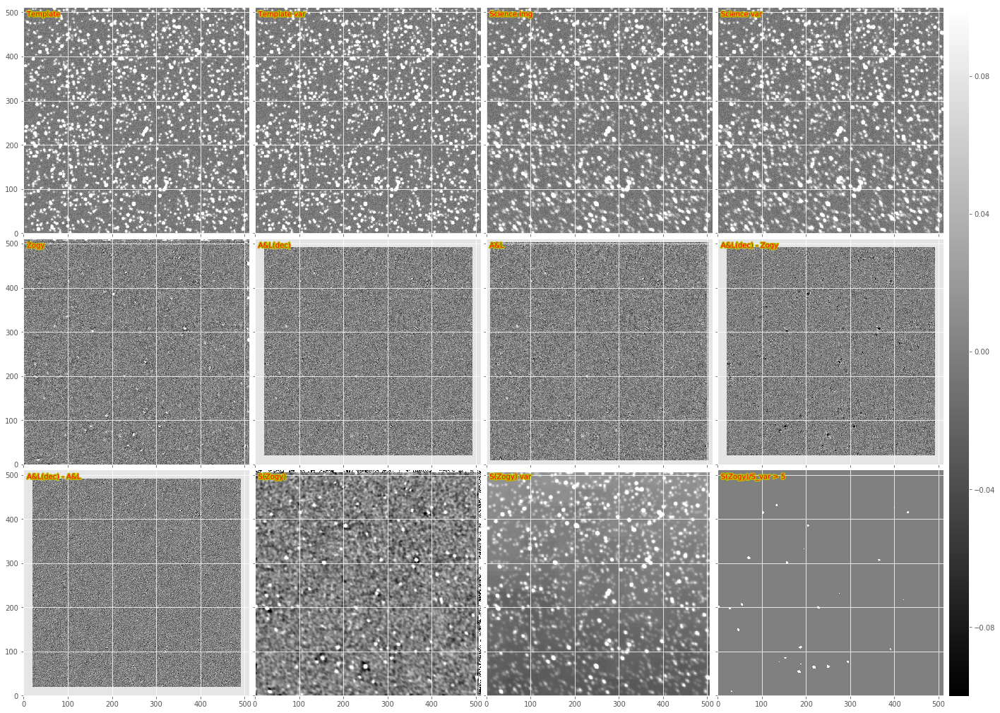

In [19]:
#print dit.computeClippedImageStats(ga(exposure2))
#print dit.computeClippedImageStats(ga(newExp))
#print dit.computeClippedImageStats(ga(newExp2))
#print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
#print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp2) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
#dit.plotImageGrid((ga(newExp2), ga(newExp), testObj.S_Zogy.im,
#                  ga(newExp2) - testObj.S_Zogy.im), imScale=12)
testObj2 = testObj.clone()
testObj2.D_Zogy = dit.Exposure(ga(newExp2), dit.psf.afwPsfToArray(newExp2.getPsf()), gv(newExp2))
testObj2.S_Zogy = dit.Exposure(ga(newExp2_Scorr), dit.psf.afwPsfToArray(newExp2_Scorr.getPsf()), gv(newExp2_Scorr))
testObj2.doPlot(imScale=6, include_Szogy=True);

In [20]:
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 17, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 17, 'TP': 10}}

In [21]:
# for comparison, without using a spatially-varying PSF:
testObj.runTest()

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 2, 'FP': 53, 'TP': 8},
 'Zogy': {'FN': 4, 'FP': 75, 'TP': 6}}

In [22]:
# let's add the one where I used the *input* but variable PSF
testObj3 = testObj.clone()
testObj3.D_Zogy = dit.Exposure(ga(newExp), testObj.D_Zogy.psf, newExp.getMaskedImage().getVariance().getArray())
testObj3.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj3.runTest()

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 0, 'TP': 10}}